# Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
import os
import torch
import tqdm
import matplotlib.pyplot as plt
os.chdir("drive/MyDrive/")
os.listdir()

['Recommendations.gdoc',
 'Colab Notebooks',
 'Summary_v0.gdoc',
 'Untitled document (1).gdoc',
 'References.gdoc',
 'Reinforcement learning for process synthesis.gdoc',
 'Optimisation_Coursework_2_FIRST_DRAFT.pdf',
 'Second_Draft Optimisation.pdf',
 'Thrid_Draft optimisation.pdf',
 'H801P-assignment2.pdf',
 'Speech1.pdf',
 'Advanced Machine learning paper summaries.gdoc',
 'Speech_Generation_KWS_coursework-final (2).pdf',
 '1542457.pdf',
 'Case2.pdf',
 '.ipynb_checkpoints',
 'test.txt',
 'Untitled document.gdoc',
 'TODO.gdoc',
 'Untitled spreadsheet.gsheet',
 'Schedule.gsheet',
 'Final year',
 'Boltzmann_1',
 'PytorchThesis',
 'Learn_JAX']

In [3]:
!nvidia-smi

Sun Jul 11 15:01:27 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Git Clone if need be

## If we want to remove exisiting code

In [ ]:
os.chdir("..")


In [ ]:
!rm -r PytorchThesis/

In [ ]:
os.listdir()

['srv',
 'lib',
 'usr',
 'opt',
 'media',
 'proc',
 'boot',
 'sys',
 'mnt',
 'dev',
 'var',
 'bin',
 'sbin',
 'run',
 'lib64',
 'home',
 'etc',
 'tmp',
 'root',
 'content',
 '.dockerenv',
 'tools',
 'datalab',
 'tensorflow-1.15.2',
 'lib32']

## Git Clone

In [ ]:
!git clone https://github.com/lollcat/Boltzmann-Generators.git --branch ToyProblems --single-branch PytorchThesis

Cloning into 'PytorchThesis'...
remote: Enumerating objects: 1240, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (152/152), done.
remote: Total 1240 (delta 99), reused 212 (delta 80), pack-reused 1006
Receiving objects: 100% (1240/1240), 141.51 MiB | 15.43 MiB/s, done.
Resolving deltas: 100% (664/664), done.
Checking out files: 100% (271/271), done.


# Setup Dir

In [4]:
os.listdir()

['Recommendations.gdoc',
 'Colab Notebooks',
 'Summary_v0.gdoc',
 'Untitled document (1).gdoc',
 'References.gdoc',
 'Reinforcement learning for process synthesis.gdoc',
 'Optimisation_Coursework_2_FIRST_DRAFT.pdf',
 'Second_Draft Optimisation.pdf',
 'Thrid_Draft optimisation.pdf',
 'H801P-assignment2.pdf',
 'Speech1.pdf',
 'Advanced Machine learning paper summaries.gdoc',
 'Speech_Generation_KWS_coursework-final (2).pdf',
 '1542457.pdf',
 'Case2.pdf',
 '.ipynb_checkpoints',
 'test.txt',
 'Untitled document.gdoc',
 'TODO.gdoc',
 'Untitled spreadsheet.gsheet',
 'Schedule.gsheet',
 'Final year',
 'Boltzmann_1',
 'PytorchThesis',
 'Learn_JAX']

In [5]:
os.chdir("PytorchThesis")
os.listdir()

['.git',
 '.gitignore',
 '.idea',
 'AIS_train',
 'FittedModels',
 'ImportanceSampling',
 'LikelihoodTrain',
 'Miscellaneous',
 'NormalisingFlow',
 'Notebooks',
 'README.md',
 'TargetDistributions',
 'Utils']

# Let's Go

## Setup

In [6]:
from TargetDistributions.DoubleWell import ManyWellEnergy
from FittedModels.utils.plotting_utils import plot_samples_vs_contours_many_well

In [7]:
from FittedModels.Models.FlowModel import FlowModel
from AIS_train.train_AIS import AIS_trainer
from ImportanceSampling.VanillaImportanceSampler import VanillaImportanceSampling
from FittedModels.utils.plotting_utils import plot_history, plot_distributions, plot_samples

import matplotlib.pyplot as plt
import torch
from Utils.plotting_utils import plot_func2D, plot_distribution
from Utils.numerical_utils import MC_estimate_true_expectation
from Utils.numerical_utils import quadratic_function as expectation_function
torch.set_default_dtype(torch.float64)

def plotter(*args, **kwargs):
    # wrap plotting function like this so it displays during training
    plot_samples_vs_contours_many_well(*args, **kwargs)
    plt.show()

In [8]:
dim = 16
target = ManyWellEnergy(dim=dim, a=-0.5, b=-6)

In [9]:
n_samples_expectation = int(1e5)
n_samples=int(1e4)

In [10]:
learnt_sampler = FlowModel(x_dim=dim, scaling_factor=2.0, flow_type="RealNVP", n_flow_steps=1)
vanilla_IS = VanillaImportanceSampling(sampling_distribution=learnt_sampler, target_distribution=target)
with torch.no_grad():
    expectation_vanilla, info_dict_vanilla = \
    vanilla_IS.calculate_expectation(n_samples_expectation, expectation_function=expectation_function)
    print(f"ESS is {info_dict_vanilla['effective_sample_size']/n_samples_expectation}, \
          var is {torch.var(info_dict_vanilla['normalised_sampling_weights'])}")

ESS is 1.038354547294124e-05,           var is 9.63061816464297e-06


In [10]:
learnt_sampler = FlowModel(x_dim=dim, scaling_factor=2.0, flow_type="RealNVP", n_flow_steps=100)
tester = AIS_trainer(target, learnt_sampler, loss_type=False, n_distributions=30, n_steps_transition_operator=1,
                    step_size=1.0, transition_operator="HMC", learnt_dist_kwargs={"lr": 1e-4},
                     loss_type_2="alpha_2",  train_AIS_params=False, inner_loop_steps=5)

In [11]:
tester.AIS_train.transition_operator_class.train_params, tester.AIS_train.transition_operator_class.auto_adjust_step_size

(False, True)

In [15]:
expectation_before, info_dict_before = tester.AIS_train.calculate_expectation(n_samples_expectation,
                                                                    expectation_function=expectation_function,
                                                                             batch_size=int(1e3))
print(info_dict_before['effective_sample_size'].item() / n_samples_expectation)
#torch.cuda.empty_cache()

3.555649255326544e-05


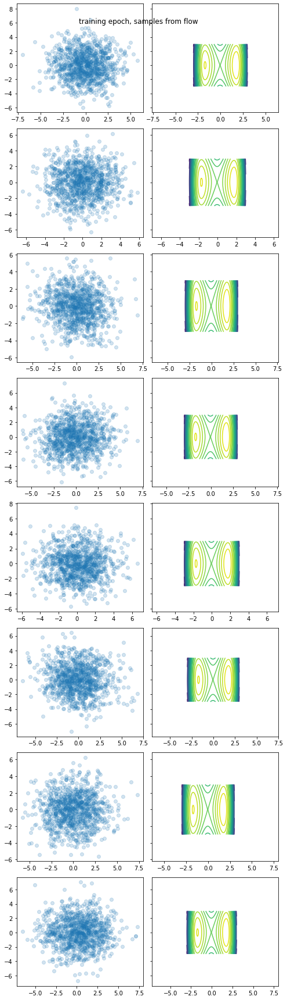

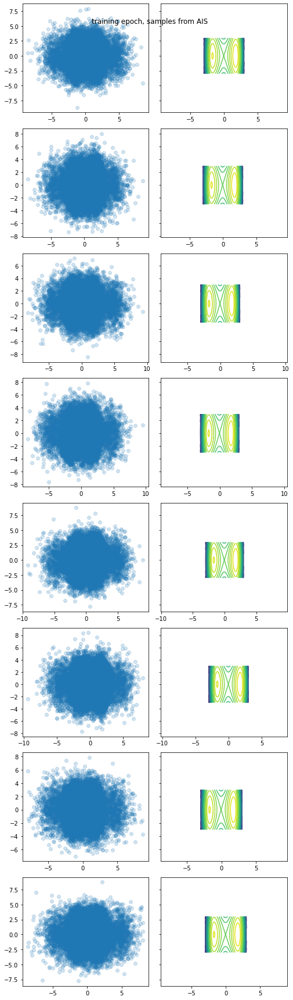

In [16]:
plot_samples_vs_contours_many_well(tester, n_samples=1000,
                                      title=f"training epoch, samples from flow")
plot_samples_vs_contours_many_well(tester, n_samples=None,
                                      title=f"training epoch, samples from AIS",
                                      samples_q=info_dict_before["samples"])

## RUn First iter

  0%|          | 0/3000 [00:00<?, ?it/s]

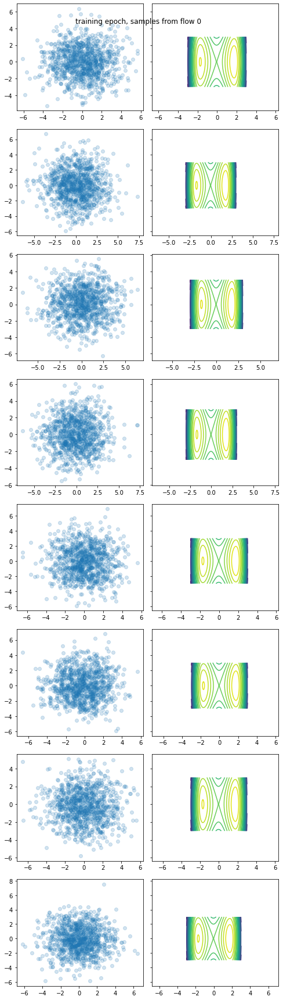

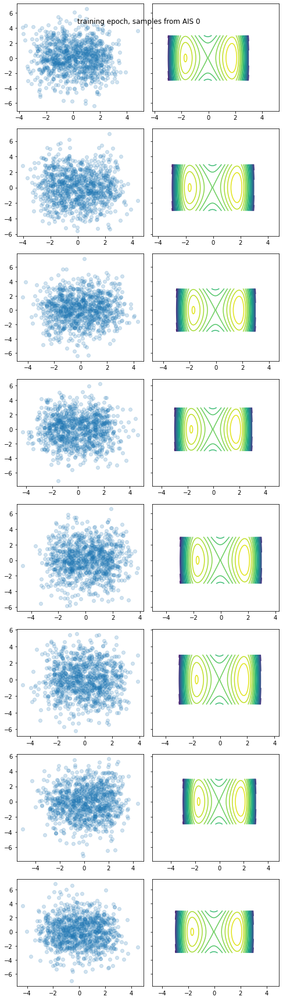

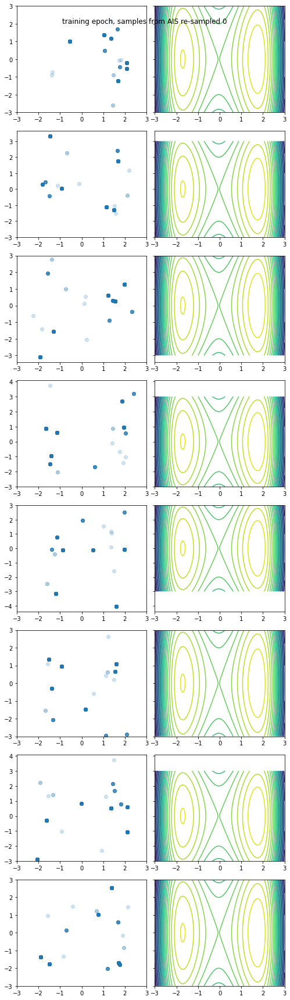

loss: 182.9248726706346,   log_p_x_post_AIS 57.6850650828823, ESS 0.009626577575373678:  10%|█         | 300/3000 [1:21:10<12:08:23, 16.19s/it]  

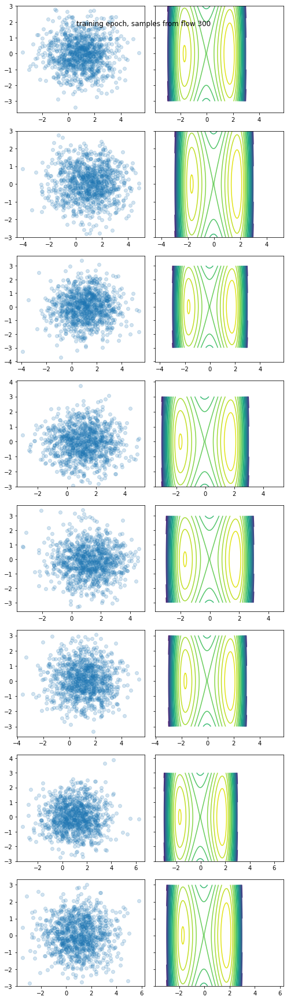

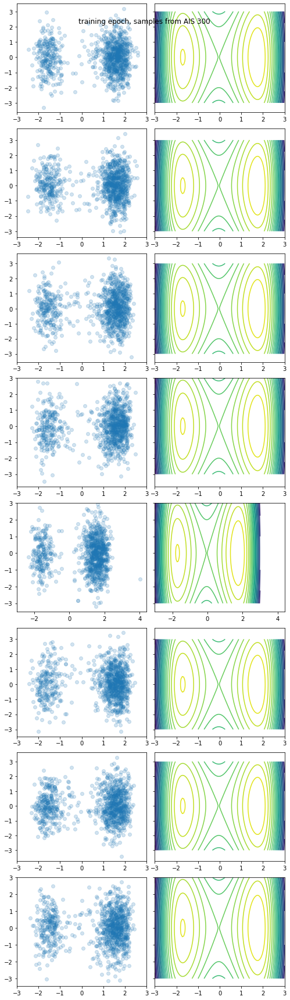

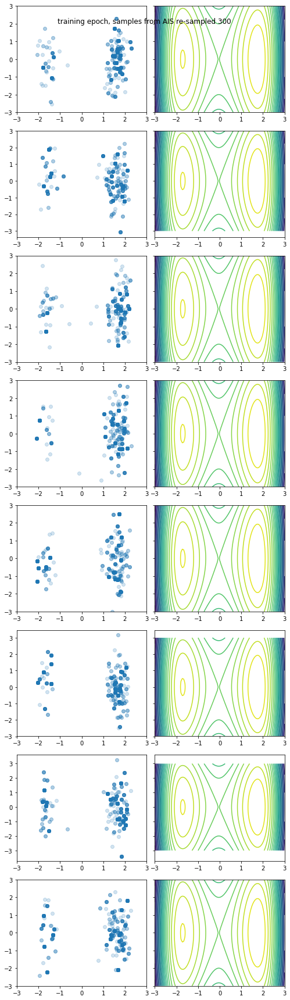

loss: 182.69192254513482,   log_p_x_post_AIS 58.367030478648346, ESS 0.011041010848909405:  20%|██        | 600/3000 [2:44:18<10:58:02, 16.45s/it]

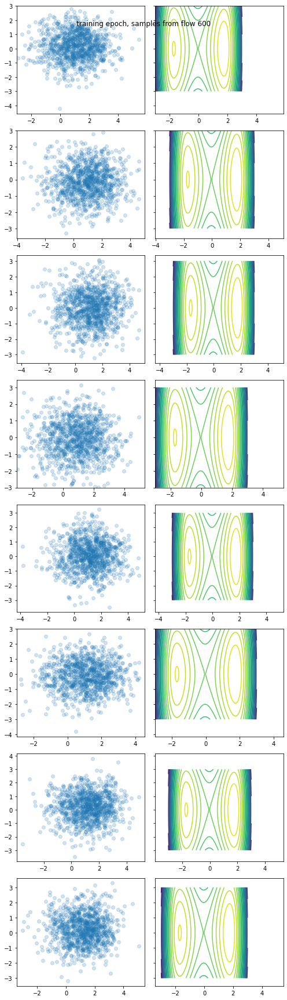

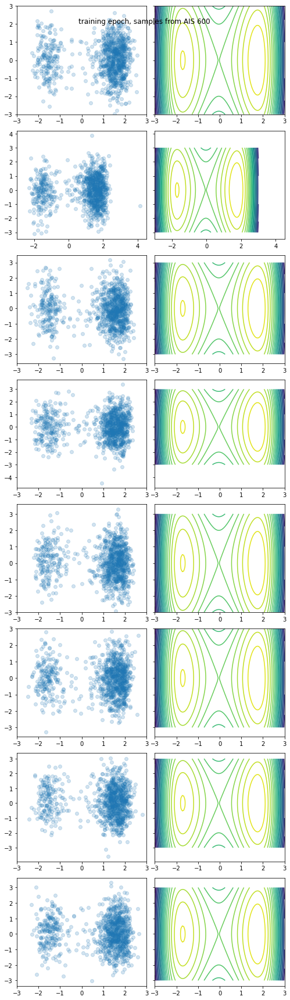

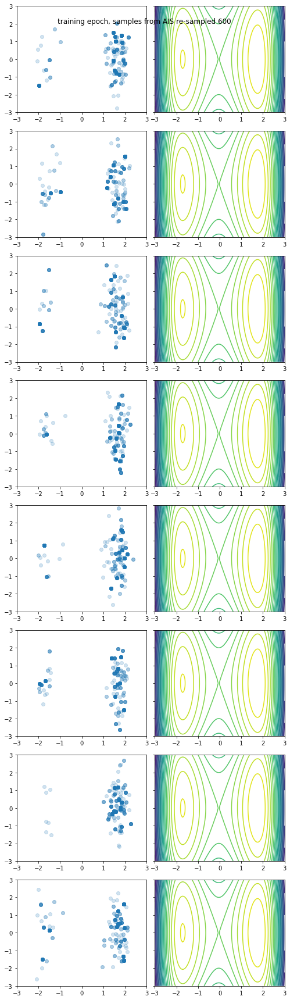

loss: 182.6447004886933,   log_p_x_post_AIS 59.17198041614604, ESS 0.010351373939113706:  30%|███       | 900/3000 [4:06:13<9:28:52, 16.25s/it]

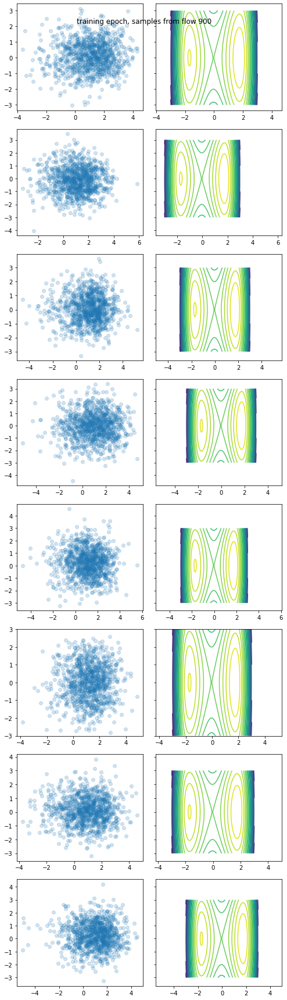

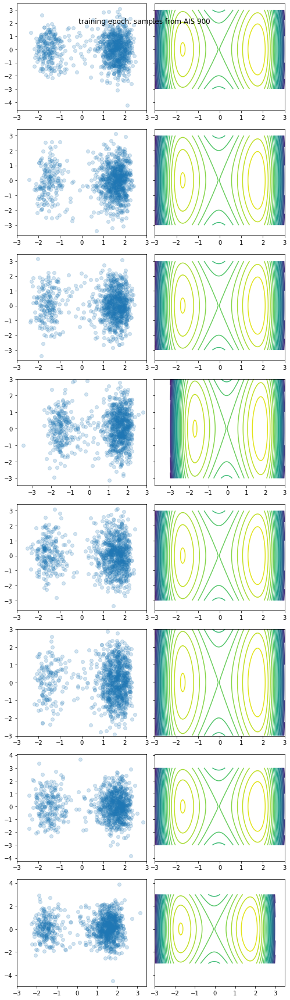

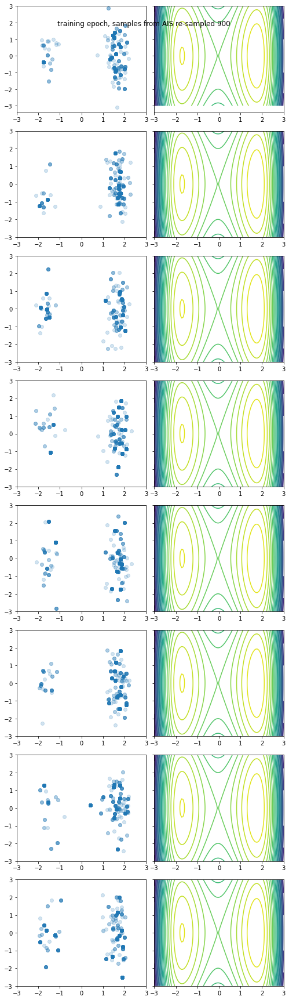

loss: 182.3118195672728,   log_p_x_post_AIS 59.53054814713382, ESS 0.013676957771318107:  40%|████      | 1200/3000 [5:28:01<8:14:15, 16.48s/it] 

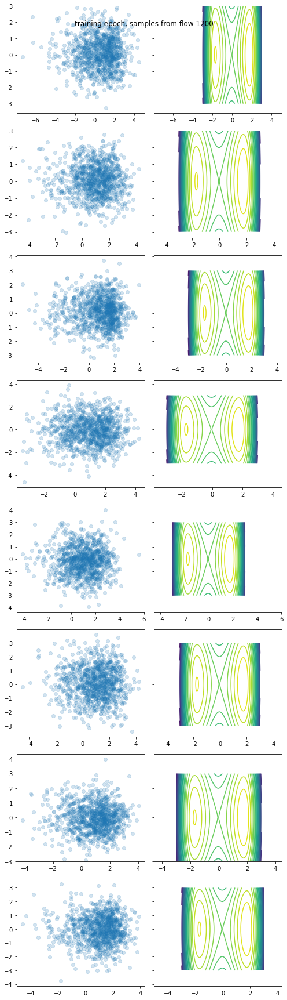

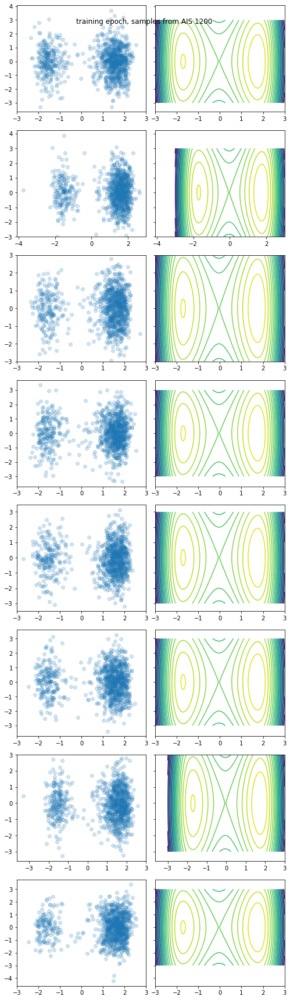

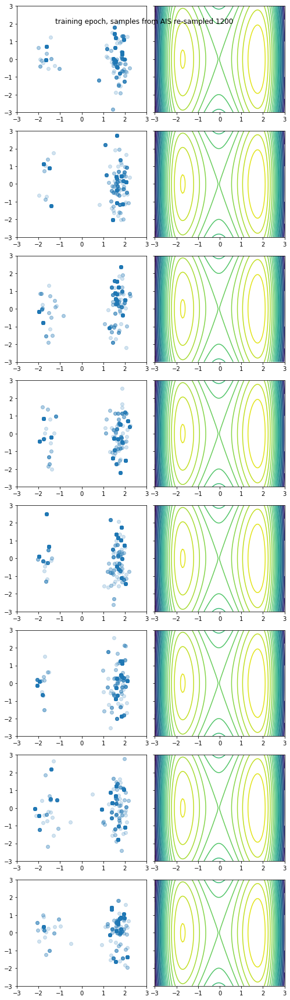

loss: 181.67192523297555,   log_p_x_post_AIS 58.788681624064814, ESS 0.014239152172252575:  50%|█████     | 1500/3000 [6:49:24<6:49:32, 16.38s/it]

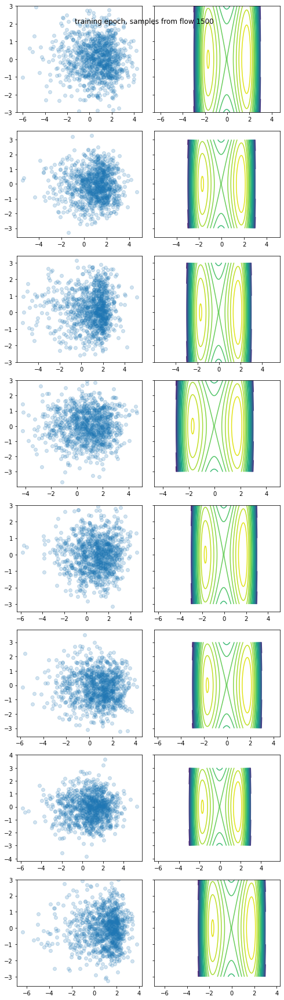

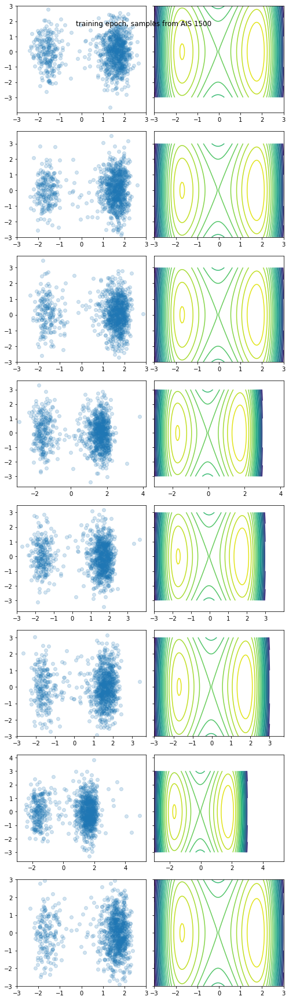

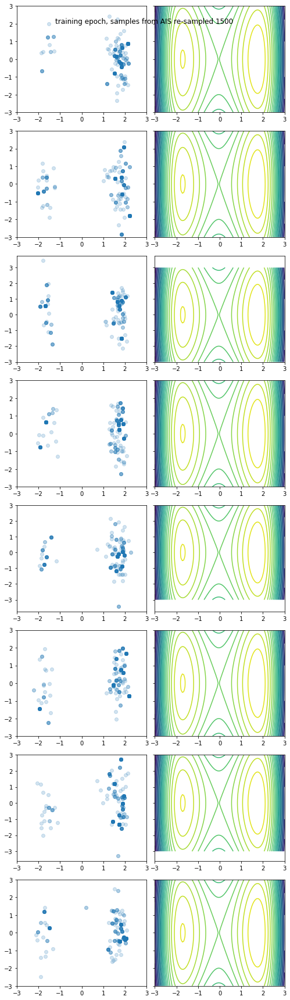

loss: 181.44350212455393,   log_p_x_post_AIS 57.031117062515435, ESS 0.013824786520182741:  60%|██████    | 1800/3000 [8:10:56<5:25:54, 16.30s/it]

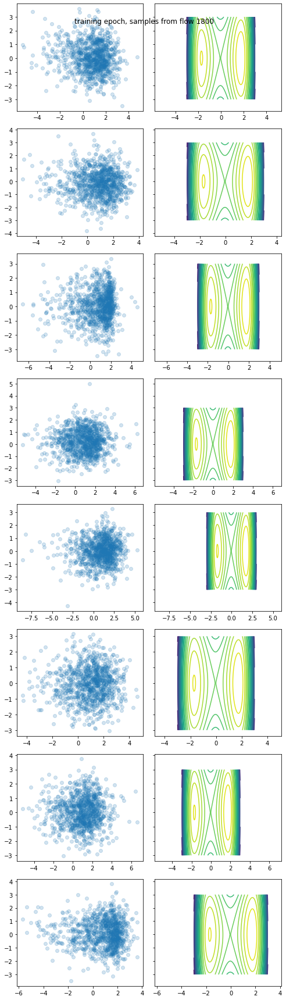

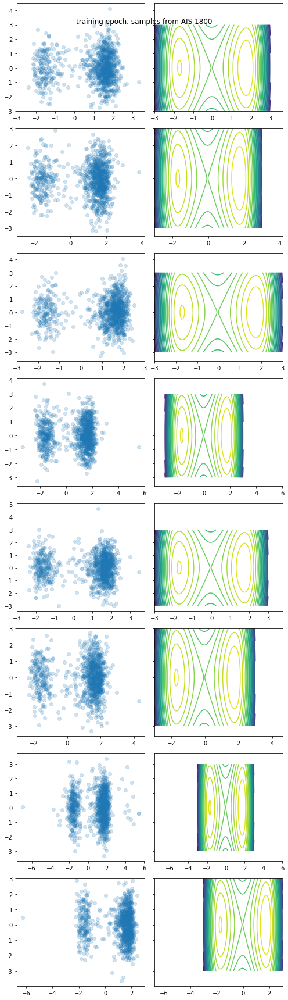

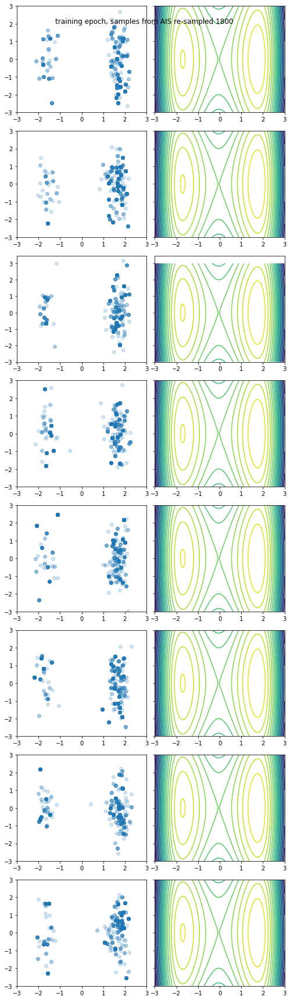

loss: 180.85938902731135,   log_p_x_post_AIS 57.10218398108529, ESS 0.01642493608907492:  70%|███████   | 2100/3000 [9:32:00<4:01:03, 16.07s/it]  

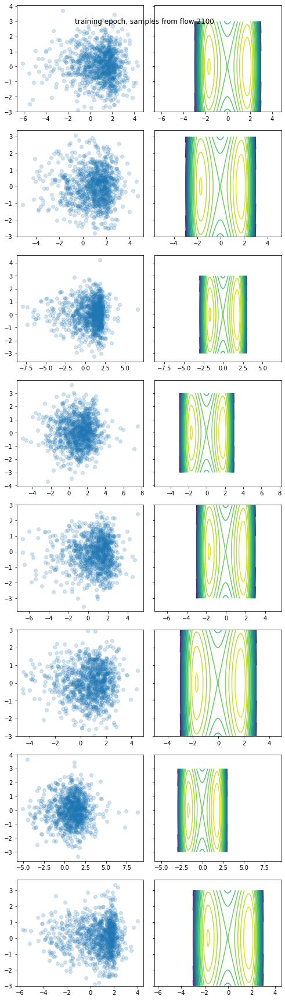

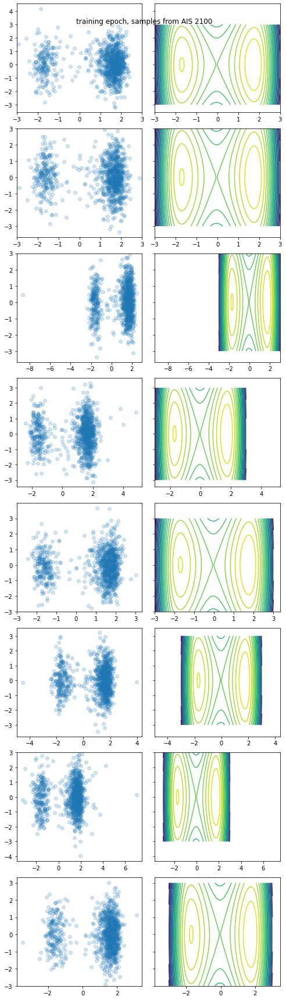

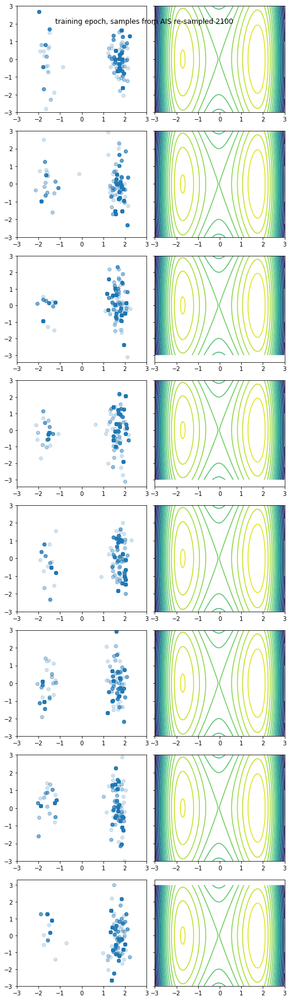

loss: 180.15648645286723,   log_p_x_post_AIS 57.194791609859685, ESS 0.020584884970374473:  80%|████████  | 2400/3000 [10:52:39<2:40:53, 16.09s/it]

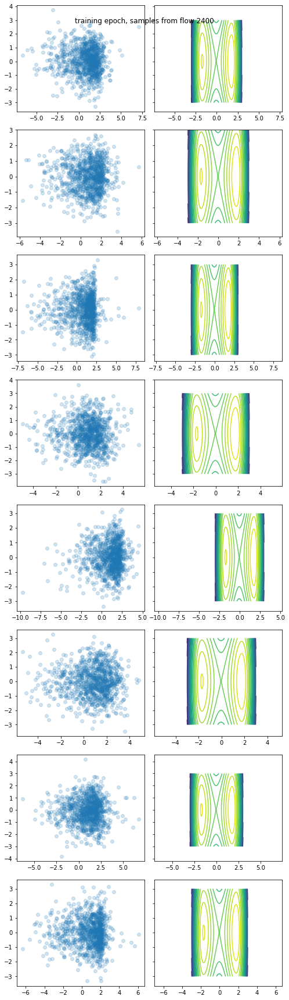

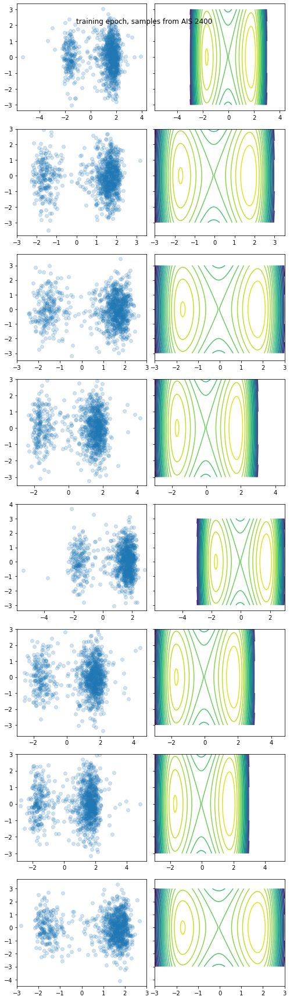

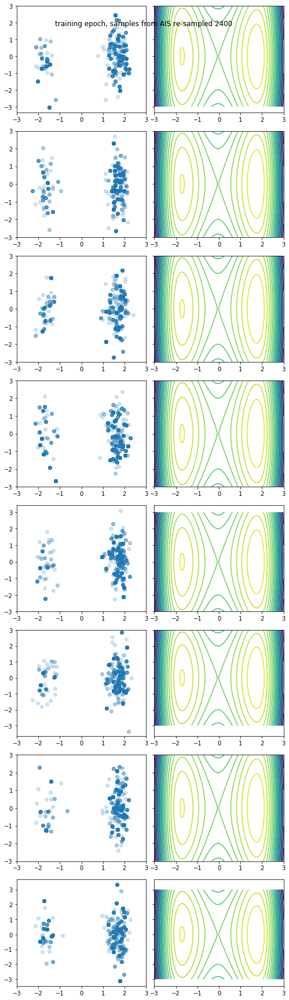

loss: 180.36975076683711,   log_p_x_post_AIS 55.703883799154696, ESS 0.022161313487882063:  90%|█████████ | 2700/3000 [12:13:02<1:20:39, 16.13s/it]

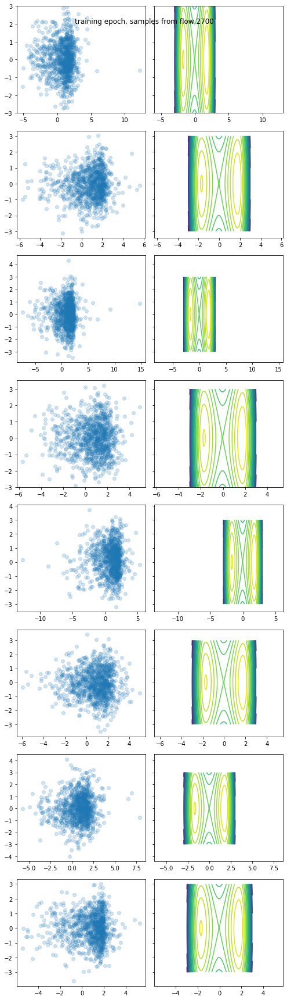

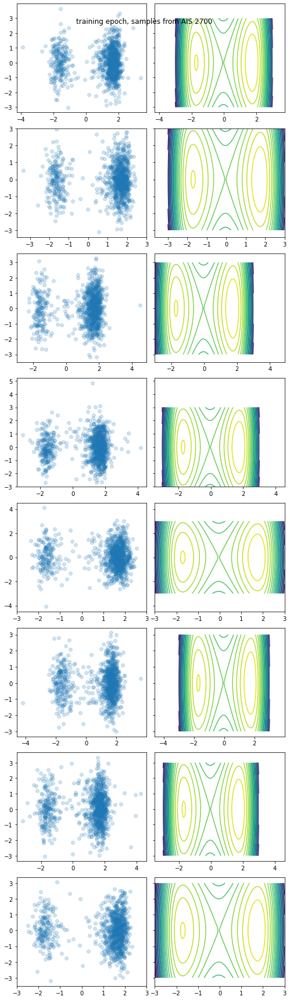

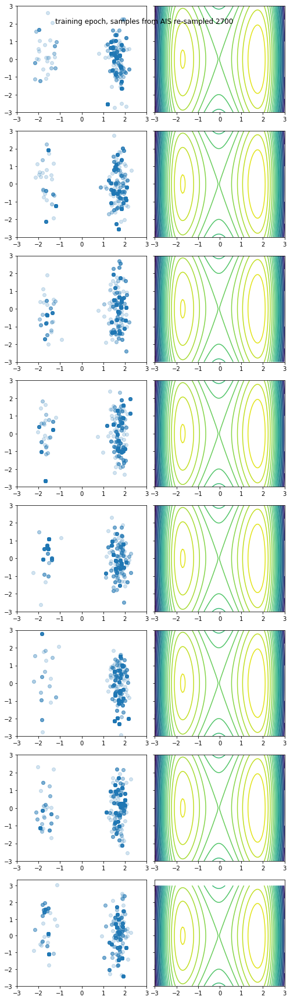

loss: 179.96469391207037,   log_p_x_post_AIS 52.96880539323028, ESS 0.022996784684700792: 100%|██████████| 3000/3000 [13:32:28<00:00, 16.25s/it]


In [12]:
history = tester.train(3000, batch_size=int(1e3), intermediate_plots=True, n_plots=10, plotting_func=plotter)

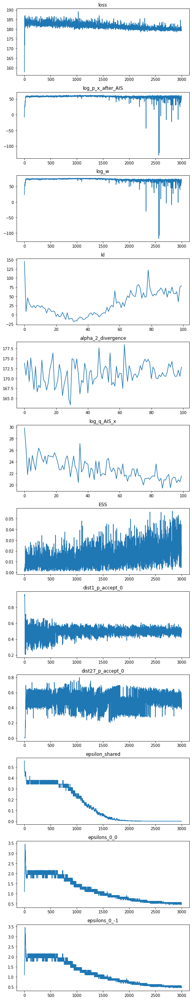

In [13]:
plot_history(history)

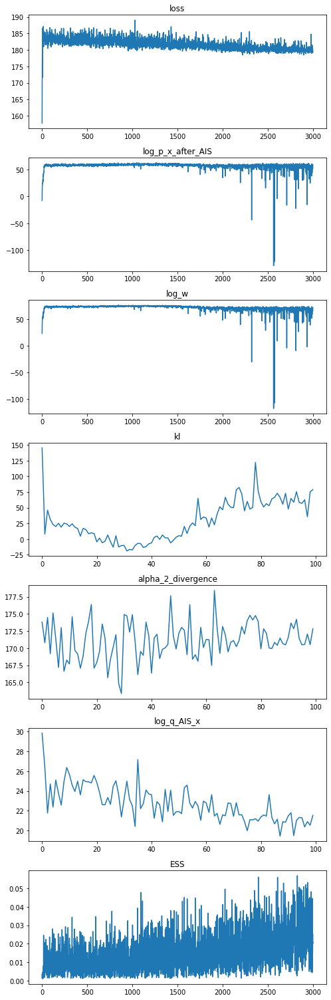

In [14]:
plot_history(dict([(key, history[key]) for key in ('loss', 'log_p_x_after_AIS', 'log_w', 'kl', 
                                               'alpha_2_divergence', 'log_q_AIS_x', 'ESS')]))

In [15]:
expectation, info_dict = tester.AIS_train.calculate_expectation(n_samples_expectation,
                                                                    expectation_function=expectation_function,
                                                                             batch_size=int(1e3),
                                                               drop_nan_and_infs=True)
print(info_dict['effective_sample_size'].item() / info_dict["normalised_sampling_weights"].shape[0])

0.008813889518166763


In [ ]:
expectation_flo, info_dict_flo = tester.AIS_train.calculate_expectation_over_flow(n_samples_expectation,
                                                                    expectation_function=expectation_function,
                                                                             batch_size=int(1e3),
                                                               drop_nan_and_infs=True)
print(info_dict_flo['effective_sample_size'].item() / info_dict_flo["normalised_sampling_weights"].shape[0])

In [ ]:
plot_samples_vs_contours_many_well(tester, n_samples=1000,
                                      title=f"training epoch, samples from flow")
plot_samples_vs_contours_many_well(tester, n_samples=None,
                                      title=f"training epoch, samples from AIS",
                                      samples_q=info_dict["samples"])

# Another Iter

In [ ]:
history = tester.train(2000, batch_size=int(1e3), intermediate_plots=True, n_plots=10, plotting_func=plotter)

In [ ]:
plot_history(history)

In [ ]:
plot_history(dict([(key, history[key]) for key in ('loss', 'log_p_x_after_AIS', 'log_w', 'kl', 
                                               'alpha_2_divergence', 'log_q_AIS_x', 'ESS')]))

In [ ]:
expectation, info_dict = tester.AIS_train.calculate_expectation(n_samples_expectation,
                                                                    expectation_function=expectation_function,
                                                                             batch_size=int(1e3),
                                                               drop_nan_and_infs=True)
print(info_dict['effective_sample_size'].item() / info_dict["normalised_sampling_weights"].shape[0])

In [ ]:
expectation_flo, info_dict_flo = tester.AIS_train.calculate_expectation_over_flow(n_samples_expectation,
                                                                    expectation_function=expectation_function,
                                                                             batch_size=int(2e3),
                                                               drop_nan_and_infs=True)
print(info_dict_flo['effective_sample_size'].item() / info_dict_flo["normalised_sampling_weights"].shape[0])

In [ ]:
plot_samples_vs_contours_many_well(tester, n_samples=1000,
                                      title=f"training epoch, samples from flow")
plot_samples_vs_contours_many_well(tester, n_samples=None,
                                      title=f"training epoch, samples from AIS",
                                      samples_q=info_dict["samples"])